# Introduction

This notebook aims to cover the topic of processing unstructured data such as images and audio files using Google Colab, TensorFlow 2.0 and TensorFlow Hub.

To achieve this goal, a model is going to be trained to solve Kaggle's Dog Breed Identification competition (Available at: https://www.kaggle.com/competitions/dog-breed-identification/data)

## 0. Runtime Configuration

## 1. Problem Definition

Identifying the breed of a dog given a photo of a dog.

## 2. Data

https://www.kaggle.com/competitions/dog-breed-identification/data

## 3. Evaluation

From Kaggle's competition rules, the evaluation will be a file containg the probabilities for each dog breed in every given image.

## 4. Features
* Unstructured Data in .jpg format.
* 120 possible dog breeds.
> In the context of Multi-Class Classification, this translates to 120 different classes.
* Test and train sets are comprised of around 10k images each.

# Data Extraction

To start the project, it is necessary to upload the project data to Google Drive and mount the drive to this notebook (or access it using Kaggle's API) and extract it.

> If zip files are not extracted correctly: https://medium.com/@uj07077/extract-a-large-zip-file-in-google-drive-colab-without-missing-files-375c6ff8c9de

In [ ]:
!unzip -u "/content/drive/MyDrive/Colab_Notebooks/DogBreeds_data/train.zip" -d "/content/drive/MyDrive/Colab_Notebooks/DogBreeds_data"

# This cell does not need to be ran everytime. Run again if having problems with the amount of images in the train folder.

Archive:  /content/drive/MyDrive/Colab_Notebooks/DogBreeds_data/train.zip


In [ ]:
# Importing Tools

import tensorflow as tf
import tensorflow_hub as hub

print("TF Version: ", tf.__version__)
print("TF Hub Version: ", hub.__version__)

# Checking for GPU availability:

print("\nGPU Status: ", "\n\nGPU ok!" if tf.config.list_physical_devices("GPU") else "\n\nGPU not available")

TF Version:  2.17.1
TF Hub Version:  0.16.1

GPU Status:  

GPU ok!


# Setting up the Workspace

* Importing TensorFlow 2.x
* Importing TensorFlow Hub
* Using a GPU for the environemment
> Changed in Colab's Runtime configurations...

## Data preprocessing - Converting into Tensors

The first step into building a ML Model on unstructured data is to get the data into a format the computer can understand. For example, tensors (matrix like structures) which are used by TensorFLow.

### Accessing the labels:

In [ ]:
import pandas as pd

labels_csv = pd.read_csv("/content/drive/MyDrive/Colab_Notebooks/DogBreeds_data/labels.csv")

# Visualizing what the labels look like:

print(labels_csv.describe())
print("\n",labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126

                                  id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


<Axes: xlabel='breed'>

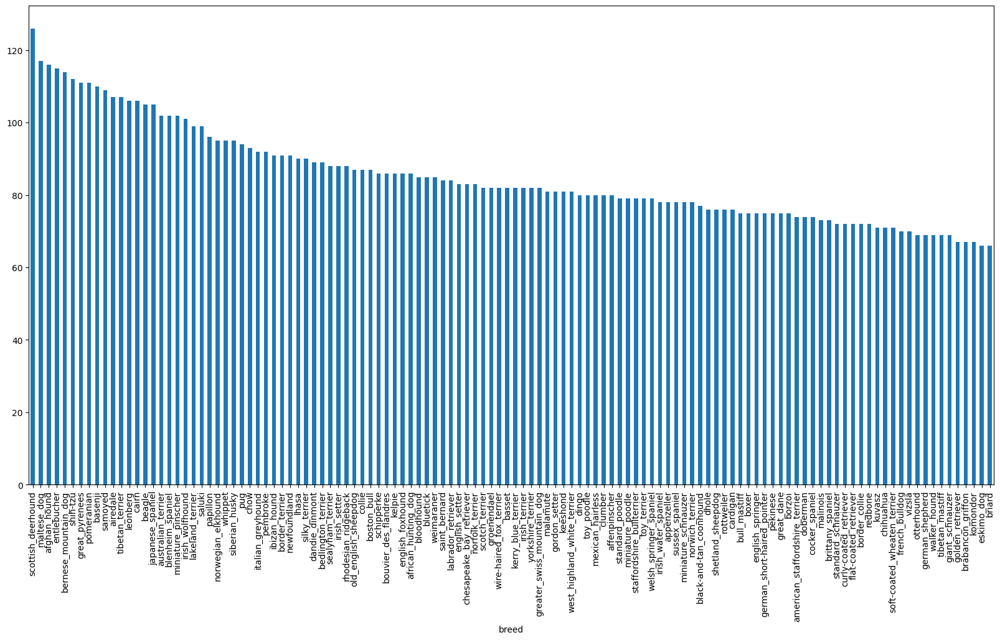

In [ ]:
# Seeing how many exmaples are there for each breed:

labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [ ]:
# Finding the average number of specimens per breed:

labels_csv["breed"].value_counts().median()

82.0

>This value is adequate... Google's AutoML (a google service for creating ML models) recomends a minimum of 10 samples to start building a model.

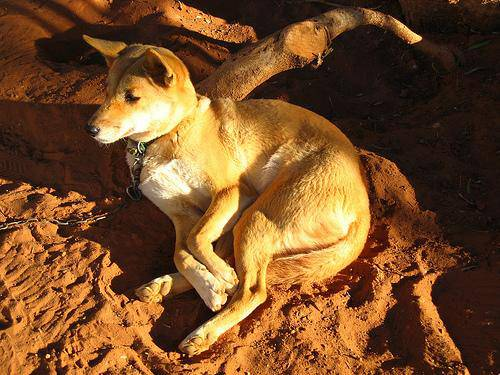

In [ ]:
# Visualizing a sample image:

from IPython.display import Image

Image("/content/drive/MyDrive/Colab_Notebooks/DogBreeds_data/train/" + labels_csv["id"][1] + ".jpg")

### Getting Images and their labels

The make the analysis easier, it is possible to create a list of all image's file paths

In [ ]:
filenames = ["/content/drive/MyDrive/Colab_Notebooks/DogBreeds_data/train/" + fname for fname in labels_csv["id"] + ".jpg"]

# Checking the first 10 Values:

filenames[:10]

['/content/drive/MyDrive/Colab_Notebooks/DogBreeds_data/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Colab_Notebooks/DogBreeds_data/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Colab_Notebooks/DogBreeds_data/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Colab_Notebooks/DogBreeds_data/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Colab_Notebooks/DogBreeds_data/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/Colab_Notebooks/DogBreeds_data/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/Colab_Notebooks/DogBreeds_data/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/Colab_Notebooks/DogBreeds_data/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/Colab_Notebooks/DogBreeds_data/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/Colab_Notebooks/DogBreeds_data/train/0042188c895a2f14ef64a918ed9c7

In [ ]:
# Checking if number of filenames matches the actual number of images in the folder:

import os

if(len(filenames) == len(os.listdir("/content/drive/MyDrive/Colab_Notebooks/DogBreeds_data/train"))):
  print("\nThe \"filenames\" array contains the same number of items as the given directory!")
else:
  print("\nThe \"filenames\" array does not contain the same number of items as the given directory!")

print(len(filenames), len(os.listdir("/content/drive/MyDrive/Colab_Notebooks/DogBreeds_data/train")))


The "filenames" array contains the same number of items as the given directory!
10222 10222


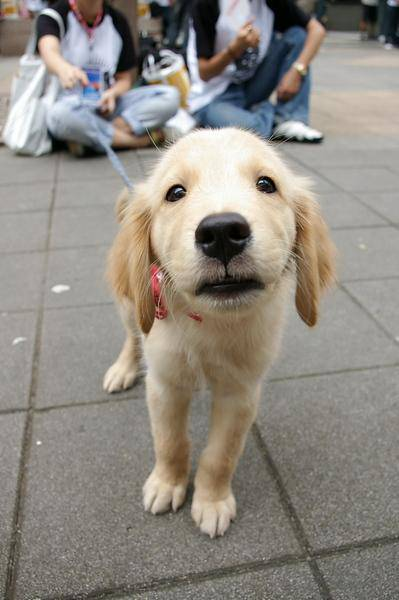

In [ ]:
Image(filenames[342])

### Preparing the Labels:

In [ ]:
import numpy as np

labels = labels_csv["breed"].to_numpy()
# labels = np.array(labels) # Equivalent to the command above
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
# Checking if the number of labels matches the number of filenames (Searching for missing data)

if len(labels) == len(filenames):
  print("Number of labels match number of filenames!")
else:
  print("Number of labels does not match number of filenames! Check data Directories")

print("Number of labels: " + str(len(labels)) + " | Number of filenames: " + str(len(filenames)))

Number of labels match number of filenames!
Number of labels: 10222 | Number of filenames: 10222


In [ ]:
# Find the unique label values:

unique_breeds = np.unique(labels)
len(unique_breeds)

120

> All we have at this point is an array of strings containing the possible labels... In order to make this array useful for annalysis it is possible to generate an array of booleans from it (similar to OneHotEncoding)

In [ ]:
# Turning a single label into an array of booleans

labels[0] == unique_breeds

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Repeating the process for every label:

boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
# Example: turning boolean array into integers:

print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) # Index where label occurs
print(boolean_labels[0].argmax()) # Index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # There should be a 1 where the target labels occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating a validation set



In [ ]:
# Setting up X and y variables:

X = filenames
y = boolean_labels

* In order to optimize the time between experiments, ~1000 images will be used at first and this number shall be increased as needed.

In [ ]:
# Setiing up the number of images for experimenting:

NUM_IMAGES = 1000 #@param {type: "slider", min:1000, max:10000, step:1000}

In [ ]:
# Splitting the data into train and validation sets:

from sklearn.model_selection import train_test_split

# Splitting the images into training and validation sets of total size equal to NUM_IMAGES

X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state = 42)

# Checking if the data was split correctly:
len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

## Preprocessing Images - Transforming into Tensors

Workflow:

1. Take an image filepath as input.
2. Use TensorFlow to read the file and save it to a variable named `image`.
3. Turn `image` into Tensors.
4. Normalize `image`: convert color channel values from (0 - 255)  to  (0 - 1)
5. Resize `image` to be a shape of (224, 224).
6. Return the modified `image`.

Resources:

- https://www.tensorflow.org/tutorials/load_data/images?hl=pt-br

- https://www.tensorflow.org/api_docs/python/tf/data/Dataset

- Specialists

1. Yann LeCun
2. Jeremy Howard

In [ ]:
# Converting an image to a numpy array -> (Heigh, Width, Color_Channel)
from matplotlib.pyplot import imread

image = imread(filenames[42])
image.shape

(257, 350, 3)

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  51],
        [ 97,  88,  47],
        [120, 111,  70]]], dtype=uint8)
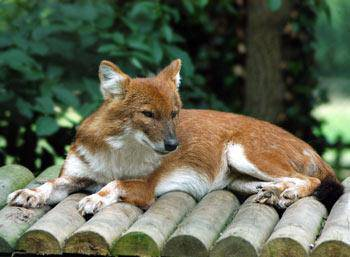

In [ ]:
image

In [ ]:
# Turning the image into a tensor:

tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  5

In [ ]:
# Defining the image size

IMG_SIZE = 224


# Creating a function to preprocess images:

def process_image(image_path, img_size = IMG_SIZE):
  """
  Takes an image file path and turns it into a Tensor.
  """

  # Reading the image file:
  image = tf.io.read_file(image_path)

  # Turning the jpg image into a numerical tensor with 3 color channels
  image = tf.image.decode_jpeg(image, channels = 3)

  # Normalizing the color channel values (0-255) -> (0-1)
  image = tf.image.convert_image_dtype(image, tf.float32)

  # Resizing the image to a squared of predefined shape
  image = tf.image.resize(image, size = [IMG_SIZE, IMG_SIZE])

  return image


### Turning data Into batches

In order not to try processing all images at once, it is recommended to split them into batches.

> A good batch size is about 32 images.

In order to properly use TensorFlow, the data needs to be in the for of Tensor tuples:

`(image, label)`

In [ ]:
# Creating a function to return the tensor tuple
def get_image_label(image_path, label):

    """
    Takes an image file path and the associated label, prcesses the image and
    returns a tuple of (image, label)
    """
    image = process_image(image_path)

    return image, label

In [ ]:
# Testing the function:

get_image_label(X[42], y[42])

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

In [ ]:
# Defining batch size:

BATCH_SIZE = 32

# Creating a function to convert all the data into batches:

def create_data_batches(X, y = None, batch_size = BATCH_SIZE, valid_data = False, test_data = False):

  """
  Create batches of data out of image (X) and label (y) pair.

  Shuffles the data if it's training data but doesn't shuffle if it's validation data.

  Also accepts test data as inputs (no labels)
  """

  #If the data is a test set, there probably aren't labels

  if test_data:

    print("Creating test data batches...\n")
    data = tf.data.Dataset.from_tensor_slices(tf.constant(X)) # Only filepaths, no labels
    data_batch = data.map(process_image).batch(BATCH_SIZE)

    return data_batch

  # If the data is a validation dataset it does not need to be shuffled:

  elif valid_data:

    print("Creating validation data batches...\n")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # Filepaths
                                              tf.constant(y))) # Labels

    data_batch = data.map(get_image_label).batch(BATCH_SIZE)

    return data_batch

  else:

    print("Creating training data batches...\n")

    # Turning filepaths and labels into tensors

    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # Filepaths
                                              tf.constant(y))) # Labels

    # Shuffling pathnames and labels before mapping image processor function is faster
    data = data.shuffle(buffer_size = len(X))

    # Creating (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turning into batches
    data_batch = data.batch(BATCH_SIZE)

  return data_batch

In [ ]:
# Creating training and validation batches:

train_data = create_data_batches(X_train, y_train)

val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...

Creating validation data batches...



In [ ]:
# Checking different attributes of the data batches:

train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

### Visualizing data Batches

It can be useful to create a function to visualize the newly created batches.

In [ ]:
import matplotlib.pyplot as plt

# Creating a function for viewing images in a data batch

def show_25_images(images, labels):

  """
  Displays a plot of 25 images and their labels from a data batch.
  """

  # Setting up the figure and subplots:
  fig, axes = plt.subplots(5, 5, figsize=(10, 10)) # Create the figure and subplots outside the loop
  axes = axes.flatten() # Flatten the 2D array of axes into a 1D array

  # Looping through 25 images:

  for i in range(25):

    # Access the specific subplot using indexing
    ax = axes[i]

    # Displaying an image on the current subplot
    ax.imshow(images[i])

    # Adding the image label as the title:
    ax.set_title(unique_breeds[labels[i].argmax()])

    # Turning off gridlines
    ax.axis("off")



In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())

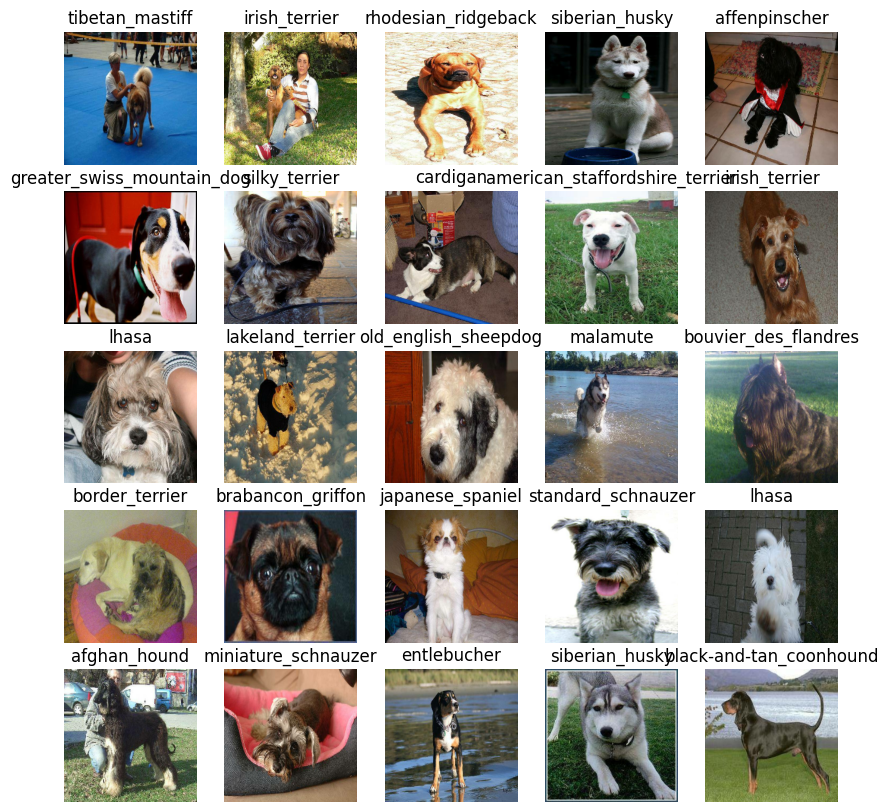

In [ ]:
# Testing the visualization function:

show_25_images(train_images, train_labels)

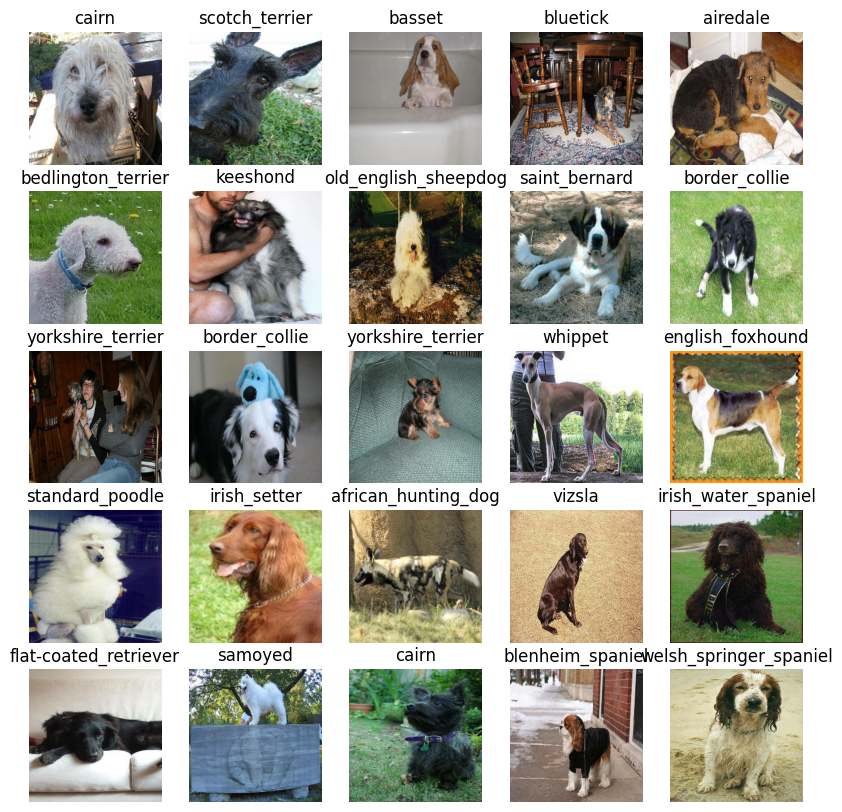

In [ ]:
# Visualizing the validation set:

val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building the model

Before building a model, there are a few thing to define:
1. Input shape (images as Tensors) to the model
2. Output shape (image labels as Tensors) of the model.
3. URL of the desired model from TensorFlow Hub.

Resources:
* https://www.tensorflow.org/hub?hl=pt-br

* https://pytorch.org/hub/

* https://modelzoo.co/

* https://paperswithcode.com/

* https://www.kaggle.com/models?tfhub-redirect=true

* Keras-API: https://www.tensorflow.org/guide/keras?hl=pt-br



Model URL:

https://www.kaggle.com/models/google/mobilenet-v2/tensorFlow2/130-224-classification

In [ ]:
# Configuring input shaoe to the model:

INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # [batch, widht, height, color channels]
# INPUT_SHAPE = [IMG_SIZE, IMG_SIZE, 3]

# Configuring the output shape:

OUTPUT_SHAPE = len(unique_breeds)

# Configuring model URL from TFHub

MODEL_URL = "https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2"



It is useful to create a function to:

* Take the input shape, output shape and chosen model as parameters
* Define the layers in a Keras model in sequential fashion
* Compile the model (defines how it should be evaluated and improved)
* Build the model (informs the input shape it'll receive)
* Return the model.

https://www.kaggle.com/models/google/mobilenet-v2/discussion/494541

> Re-import tf-keras as tfk and use the methods from this version instead of tf.keras...

In [ ]:
#!pip install tf_keras

import tf_keras as tfk

def create_model(input_shape = INPUT_SHAPE, output_shape = OUTPUT_SHAPE, model_url = MODEL_URL):
  model = tfk.Sequential([

      hub.KerasLayer(MODEL_URL), #Layer 1 (input layer)
      tfk.layers.Flatten(), # Adding a Flatten layer to connect the KerasLayer to the Dense layer
      tfk.layers.Dense(units = OUTPUT_SHAPE,
                            activation = "softmax") # Layer 2 (output layer)

      ])

  # Compiling the model:

  model.compile(

      loss = tfk.losses.CategoricalCrossentropy(),
      optimizer = tfk.optimizers.Adam(), # How to minimize losses?
      metrics = ["accuracy"]

  )

  # Building the model:

  model.build(INPUT_SHAPE)

  return model

In [ ]:
# Testing the function

model = create_model()
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 flatten (Flatten)           (None, 1001)              0         
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


## Writing callback Functions

Callbacks are helper functions a model can call during training to do things such as saving its progress, checking its progress or halt training if no improvement is noted.

Two callbacks will be created:

1. TensorBoard: help to track the model's progress

2. Early Stop: halts training to prevent overfitting


### TensorBoard Callback:

1. Load the TensorBoard notebook Extension
2. Create a TensorBoard Callback able to save logs to a directory and pass it to the model's `fit()`function
3. Visualize the training logs using `%tensorboard` magic function (after model training)

In [ ]:
# Loading the TensorBoard Extension:

%load_ext tensorboard

In [ ]:
import datetime

# Creating a function to define TensorBoard Callback:

def create_tensorboard_callback():

  # Creating a log directory:
  logdir = os.path.join("/content/drive/MyDrive/Colab_Notebooks/DogBreeds_data/logs",

                        #Joining with the current datetime to track the experiments:
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

  return tfk.callbacks.TensorBoard(logdir)


### Early Stopping Callback

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [ ]:
# Creating an early stopping callback

early_stopping = tfk.callbacks.EarlyStopping(monitor = "val_accuracy",
                                             patience = 3)

## Training the model on a Subset

The preliminary model will be trained on 1000 images in order to see if all the configurations have done correctly and minimize the time between experiments.

In [ ]:
# Defining the number of Epochs (passings through the dataset trying to learn patterns)

NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

# Checking if a GPU is actually being used before running the model:
print("\nGPU Status: ", "\n\nGPU ok!" if tf.config.list_physical_devices("GPU") else "\n\nGPU not available")



GPU Status:  

GPU ok!


### Creating a function to train a model:

1. Create a model using `create_model()`
2. Setup a TensorBoard callback with `create_tensorboard_callback()`
3. Call the `fit()`function on the created model passing it the training data, validation data, number of epochs to train for and callback functions
4. Return the model

In [ ]:
# Creating a function to train the model:

def train_model():
  """
  Trains a given model and returns the trained version.
  """

  # Creting a model:

  model = create_model()

  # Creating a new TensorBoard session for everytime the model is ran

  tensorboard = create_tensorboard_callback()

  # Fitting the model to the data and passing the callbacks

  model.fit(x = train_data,
            epochs = NUM_EPOCHS,
            validation_data = val_data,
            validation_freq = 1, # Validates after each epoch
            callbacks = [tensorboard, early_stopping])

  # Returns the fitted model
  return model

# Fitting the model using the created function:

model = train_model()

Epoch 1/100
25/25 [==============================] - 174s 7s/step - loss: 4.4881 - accuracy: 0.1013 - val_loss: 3.4219 - val_accuracy: 0.2500
Epoch 2/100
25/25 [==============================] - 4s 167ms/step - loss: 1.5731 - accuracy: 0.7138 - val_loss: 2.1840 - val_accuracy: 0.4750
Epoch 3/100
25/25 [==============================] - 4s 166ms/step - loss: 0.5460 - accuracy: 0.9400 - val_loss: 1.7492 - val_accuracy: 0.5650
Epoch 4/100
25/25 [==============================] - 5s 200ms/step - loss: 0.2440 - accuracy: 0.9875 - val_loss: 1.5259 - val_accuracy: 0.6100
Epoch 5/100
25/25 [==============================] - 5s 191ms/step - loss: 0.1426 - accuracy: 0.9962 - val_loss: 1.4670 - val_accuracy: 0.6300
Epoch 6/100
25/25 [==============================] - 4s 168ms/step - loss: 0.0979 - accuracy: 1.0000 - val_loss: 1.4177 - val_accuracy: 0.6250
Epoch 7/100
25/25 [==============================] - 4s 156ms/step - loss: 0.0740 - accuracy: 1.0000 - val_loss: 1.3851 - val_accuracy: 0.6250


> Note that the model is shows the following metrics:

>> `accuracy: 1.0000 |  val_accuracy: 0.6800`

> This indicates that the model is performing **much** better on the training set than on the validation set, hinting an overfitting...

### Checking the TensorBoard Logs

The TensorBoard magic function (`%tensorboard`) accesses the logs directory and visualize it's contents.

In [ ]:
%tensorboard --logdir /content/drive/MyDrive/Colab_Notebooks/DogBreeds_data/logs

<IPython.core.display.Javascript object>

## Making and Evaluating predictions with the trained model

In [ ]:
# Making predictions on the validation data (not used during training):

predictions = model.predict(val_data, verbose = 1)
predictions

7/7 [==============================] - 1s 109ms/step


array([[5.5542280e-04, 1.4934886e-05, 5.2391901e-04, ..., 5.4900134e-05,
        1.3594259e-05, 3.0045176e-03],
       [1.1306745e-03, 5.2802020e-04, 2.2683872e-03, ..., 1.2938920e-04,
        4.2606186e-04, 7.4534432e-06],
       [3.6362620e-05, 3.2251588e-05, 2.2744647e-05, ..., 9.7898403e-05,
        4.9183966e-04, 5.9847061e-05],
       ...,
       [1.5681409e-05, 4.5797449e-05, 2.9286142e-05, ..., 1.0241544e-05,
        7.3919429e-05, 7.6555552e-05],
       [2.2785971e-03, 9.2576098e-05, 1.2991557e-04, ..., 7.0862057e-05,
        3.0920663e-05, 7.2303740e-03],
       [1.4486884e-03, 1.5205069e-04, 2.9914298e-03, ..., 8.2190419e-03,
        3.4082076e-04, 1.2189840e-05]], dtype=float32)

In [ ]:
predictions.shape

# The outcome of this cells matches the expected output (200 predictions (len val_data)
#made over 120 labels (len unique_breeds))

(200, 120)

In [ ]:
# The highest value in this array matches the breed most likely to be on an image

predictions[0]

array([5.5542280e-04, 1.4934886e-05, 5.2391901e-04, 5.0589017e-05,
       5.8342830e-05, 8.4610801e-06, 1.6204379e-02, 6.8487541e-05,
       1.0096429e-04, 4.3413747e-04, 3.5494971e-04, 2.3186556e-05,
       1.8084480e-04, 8.6995369e-06, 2.6767587e-04, 6.1269099e-04,
       2.7604273e-04, 5.0041728e-02, 5.4783399e-05, 4.4228331e-05,
       1.4081844e-03, 3.1469059e-05, 2.0937781e-05, 6.2351191e-04,
       2.2507134e-05, 3.2313995e-04, 1.5145938e-01, 6.0963805e-04,
       8.2209322e-04, 1.2381934e-04, 2.7136281e-05, 4.6503494e-04,
       9.6155837e-04, 1.8782330e-05, 4.4287255e-05, 2.3142193e-02,
       7.8955236e-05, 2.4176402e-04, 1.0925674e-04, 5.4710516e-05,
       1.4889557e-03, 1.4069809e-05, 6.4643027e-05, 3.8687626e-04,
       7.5919756e-06, 1.9251590e-04, 3.6489832e-06, 2.6357381e-04,
       9.0302748e-04, 1.3483637e-04, 1.2521833e-04, 3.3971566e-05,
       6.6510940e-05, 5.7006047e-05, 3.6782818e-05, 2.3220766e-05,
       1.0456209e-04, 1.4447434e-03, 4.3887977e-04, 2.4115805e

In [ ]:
# Understanding predictions:

index = 42

print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted Label: {unique_breeds[np.argmax(predictions[index])]}")

[4.98807494e-05 1.06894273e-04 2.12752657e-05 3.95623902e-05
 1.28375378e-03 1.32157593e-05 7.93709696e-05 1.91582169e-03
 4.67923144e-03 3.51379216e-02 2.53216895e-05 6.88155660e-06
 2.51902413e-04 6.42161642e-04 4.02182835e-04 6.99988287e-03
 1.05863992e-05 3.39596700e-05 4.13001762e-05 4.13316797e-04
 3.57416720e-05 1.52841618e-04 8.15178646e-05 1.52703433e-05
 9.45429970e-03 3.53576252e-05 3.11480544e-05 1.93117539e-05
 2.07865814e-04 2.07262747e-05 3.21499792e-05 1.65123201e-04
 3.46855268e-05 1.65020010e-05 4.58011818e-05 3.04753848e-05
 4.67342907e-05 2.31894155e-04 1.22417450e-05 2.12608084e-01
 1.48131410e-04 3.97380682e-05 3.07070278e-03 2.49830327e-06
 6.32068331e-05 9.07150115e-06 2.03130199e-04 5.62447007e-04
 8.75209389e-06 1.18082869e-04 1.34023103e-05 3.88339424e-04
 2.02826268e-04 3.13887279e-03 8.50278502e-06 1.88214573e-04
 9.43748091e-05 6.68426583e-05 9.39120655e-05 2.56529602e-05
 5.96272293e-05 1.06302870e-03 7.40347059e-06 6.78693250e-05
 4.49789586e-05 3.945910

### Functionizing and Viewing predictions

In [ ]:
# Turning probabilities into labels:

def get_pred_label(prediction_probabilities):

  """
  Turns an array of prediction probabilities into a label.

  """

  return unique_breeds[np.argmax(prediction_probabilities)]

# Getting a predicted label based on an array of probabilities:

pred_label = get_pred_label(predictions[81])
pred_label

'dingo'

### Unbatching the validation data to compare it to the validation labels


In [ ]:
# Creating a function to unbatch a batch dataset:

def unbatchify(data):

  """
  Receives a batched dataset of (image, label) Tensors and returns separate arrays.

  """
  images = []
  labels = []

  # Looping through unbatched data:

  for image, label in data.unbatch().as_numpy_iterator():

    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])

  return images, labels

# Testing the funstion:

val_images, val_labels = unbatchify(val_data)

val_images[0], val_labels[0]


(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In order to actually see the image and th predicted label a function will be created to:

* Receive an array of prediction probabilities, an array of truth labels and an array of images and an integer
* Convert the prediction probabilities to a predicted label.
* Plot the predicted label, predicted probability, truth label and the target image on a single figure

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=85):

  """
  View the prediction, real label and image for sample n.

  """

  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Extracting the pred label:

  pred_label = get_pred_label(pred_prob)

  # Plotting the image and removing ticks

  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Formatting the color of the title to match the correctness of the prediction:
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Changing plot title to (predicted, pred_prob, truth_label):

  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label), color = color)


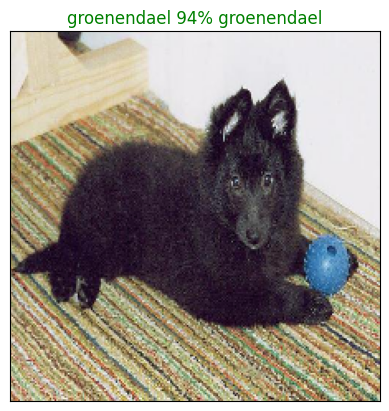

In [ ]:
# Testing the function above:

plot_pred(prediction_probabilities = predictions,
          labels = val_labels,
          images = val_images,
          n=77)

The previous function worked properly to display the model's top prediction. Below, a function will be written to display the model's top 10 predictions for the sample's breed. In order to accomplish that, the function will:

* Receive an input of prediction probabilities array, a ground truth and an integer.
* Find the prediction using `get_pred_label()`
* Find the top 10:
  * Prediction probabilities indexes
  * Prediction probabilities values
  * Prediction labels
* Plot the top 10 values and labels, coloring the true label green.




In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):

  """
  Plots the top 10 highest predictions, highlighting the true label for sampole n.
  """

  pred_prob, truth_label = prediction_probabilities[n], labels[n]

  # Get the predicted label:

  pred_label = get_pred_label(pred_prob)

  # Finding the top 10 confidence indexes:

  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  # Finding the top 10 confidence values:

  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # Finding the top 10 confidence values:

  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setting up the plot:

  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")

  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Changing the color of the correct prediction:

  if np.isin(truth_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == truth_label)].set_color("green")

  else:
    pass



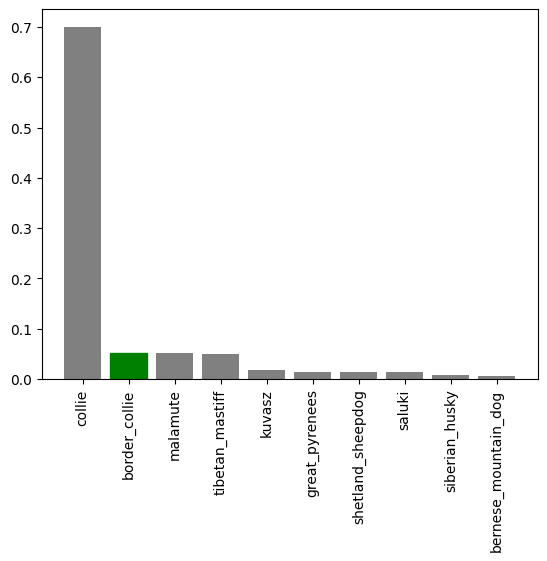

In [ ]:
# Testing the function above:

plot_pred_conf(prediction_probabilities=predictions,
               labels = val_labels,
               n=9)

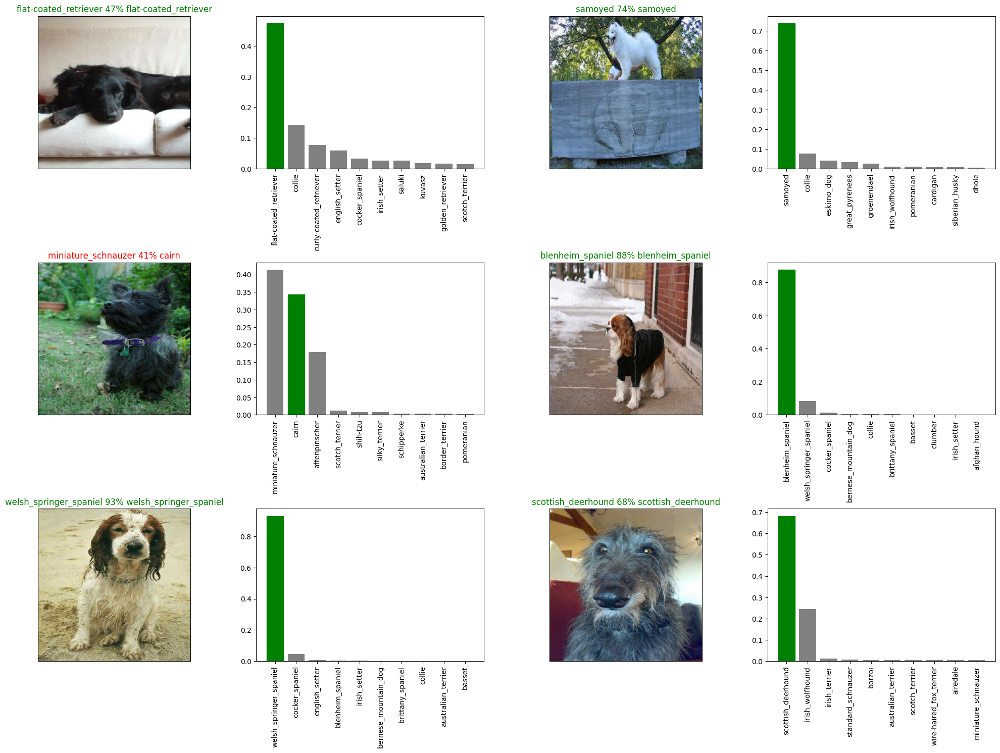

In [ ]:
# Checking a few predictions and their top 10 values:

i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))

for i in range(num_images):

  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
             labels=val_labels,
             images=val_images,
             n=i+i_multiplier)

  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)

plt.tight_layout(h_pad=1.0) # Adjusts the horizontal padding for nicer visualization
plt.show()

## Saving and reloading a trained model

> Reference: https://www.tensorflow.org/tutorials/keras/save_and_load?hl=pt-br

In [ ]:
# Creating a function to save a model:

def save_model(model, suffix = None):

  """
  Saves a given model in a model directory and appends a suffix for better identification.

  """

  # Creating a model directory pathname with current time:

  modeldir = os.path.join("/content/drive/MyDrive/Colab_Notebooks/DogBreeds_data/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))

  model_path = modeldir + "-" + suffix + ".keras"  #"keras" is the extension for saving models

  print(f"Saving model to:\n {model_path}...\n\n")
  model.save(model_path)

  return model_path

In [ ]:
# Creating a function to load a trained model:

def load_model(model_path):

  """
  Loads a saved model from a model path.

  """

  model = tfk.models.load_model(model_path,
                                custom_objects = {"KerasLayer":hub.KerasLayer})

  print(f"Loading model from:\n {model_path}...\n\n")

  return model

Testing the fuctions above:

In [ ]:
# Saving the model trained on 1000 images:

save_model(model, suffix = "1000_images_mobilenetv2_Adam")

Saving model to:
 /content/drive/MyDrive/Colab_Notebooks/DogBreeds_data/models/20241223-20421734986557-1000_images_mobilenetv2_Adam.keras...




'/content/drive/MyDrive/Colab_Notebooks/DogBreeds_data/models/20241223-20421734986557-1000_images_mobilenetv2_Adam.keras'

In [ ]:
# Loading the saved model:

loaded_1000_image_model = load_model("/content/drive/MyDrive/Colab_Notebooks/DogBreeds_data/models/20241212-18431734028991-1000_images_mobilenetv2_Adam.keras")

Loading model from:
 /content/drive/MyDrive/Colab_Notebooks/DogBreeds_data/models/20241212-18431734028991-1000_images_mobilenetv2_Adam.keras...




In [ ]:
# Evaluate the pre-saved model

model.evaluate(val_data)

7/7 [==============================] - 1s 99ms/step - loss: 1.2807 - accuracy: 0.6650


[1.280722975730896, 0.6650000214576721]

In [ ]:
# Evaluating the loaded model:

loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 2s 98ms/step - loss: 1.2272 - accuracy: 0.6500


[1.2272111177444458, 0.6499999761581421]

> The results were the same which indicates a succesful loading process.

## Training a model on the full dataset

In [ ]:
# Checking the length of the sets:

len(X), len(y)

(10222, 10222)

In [ ]:
# Creating a data batch with the full dataset

full_data = create_data_batches(X, y)

Creating training data batches...



In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Creating a model for the full set:

full_model = create_model()

In [ ]:
# Creating callbacks for the full model:

full_model_tensorboard = create_tensorboard_callback()

> Since there is no validation set when training on the full dataset it is impossible to monitor validation accuracy

In [ ]:
# Defining the early stopping callback:

full_model_early_stopping = tfk.callbacks.EarlyStopping(monitor="accuracy",
                                                        patience=3) # Number of epochs without improvement on accuracy

**WARNING**: Running the cell below will take time (up to 30 minutes)!

In [ ]:
# DEBUGING:

print(type(full_data))

i = 0

for file_path in filenames:
         if not os.path.exists(file_path):
             print(f"File not found: {file_path}")
             i += 1
print(i)

<class 'tensorflow.python.data.ops.batch_op._BatchDataset'>
0


In [ ]:
# # Fitting the full model on the full data:

# full_model.fit (x = full_data,
#                 epochs = NUM_EPOCHS,
#                 callbacks = [full_model_tensorboard, full_model_early_stopping])

# This cell only needs to be ran once (after fitting, the model is saved and can be loaded for future testing)

In [ ]:
save_model(full_model, suffix = "full_image_set_mobilenetv2_Adam")

Saving model to:
 /content/drive/MyDrive/Colab_Notebooks/DogBreeds_data/models/20241223-20421734986568-full_image_set_mobilenetv2_Adam.keras...




'/content/drive/MyDrive/Colab_Notebooks/DogBreeds_data/models/20241223-20421734986568-full_image_set_mobilenetv2_Adam.keras'

In [ ]:
# Loading the trained model:

loaded_full_model = load_model("/content/drive/MyDrive/Colab_Notebooks/DogBreeds_data/models/20241212-20481734036528-full_image_set_mobilenetv2_Adam.keras")

Loading model from:
 /content/drive/MyDrive/Colab_Notebooks/DogBreeds_data/models/20241212-20481734036528-full_image_set_mobilenetv2_Adam.keras...




## Making predictions on the test dataset

Since the model was trained on images under the Tensor Batches format, the test images will need to be transformed into this format as well.

The `create_data_batches()`will be used in this step:

* Get the images filenames
* Convert images into batches and set the `test_data` parameter to `True` (since the data does not have labels)
* Make a predictions array using the `predict()` method and passing the test batches

In [ ]:
# Loading Test images Filenames

test_path = "/content/drive/MyDrive/Colab_Notebooks/DogBreeds_data/test/"

test_filenames = [test_path + fname for fname in os.listdir(test_path)]

# Checking the first 10 entries
test_filenames[:10]

len(test_filenames)

10357

In [ ]:
# Creating the test Databatch

test_data = create_data_batches(test_filenames, test_data = True)


Creating test data batches...



In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note**: Loading the following cell will take about 60 min...

In [ ]:
# # Making predictions on test data using the loaded full model:

# test_predictions = loaded_full_model.predict(test_data,
#                                              verbose = 1)

324/324 [==============================] - 298s 905ms/step


In [ ]:
# Saving Predictions to a csv file:

np.savetxt("/content/drive/MyDrive/Colab_Notebooks/DogBreeds_data/preds_array.csv", test_predictions, delimiter = ",")

In [ ]:
# Loading Predictions from a csv file:

test_predictions = np.loadtxt("/content/drive/MyDrive/Colab_Notebooks/DogBreeds_data/preds_array.csv", delimiter = ",")

In [ ]:
test_predictions.shape

(10357, 120)

## Preparing test dataset predictions for Kaggle

* From Kaggle's competition manual, the results must be sumbmitted in a Dataframe (.csv) with an Id column and a column for each predicted dog breed's probability.

* In order to do that these steps will be taken:
  * Create a pandas Dataframe with an Id column as well as a column for each dog breed
  * Extract the Id from filepaths and add it to the Id column
  * Add predictions probabilities for each dog breed columns
  * Export the Dataframe as a csv ready to be submitted to kaggle


In [ ]:
# Creating an empty pandas Dataframe:

preds_df = pd.DataFrame(columns = ["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# Appending test images Id's to the DataFrame:

test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
test_ids[0]

preds_df["id"] = test_ids
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e381c5fcf1420985b20117e4bc7d38cd,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,df621265607ba0285bd79705eb3541e0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e50319e7efc447bb684fbfdbed3ff041,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e40a39dd88f04b29ab3cb3a986503f8f,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e5b13519aa192a386dc0c5dd7d096e70,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Adding the prediction probabilities to each dog breed column:

preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e381c5fcf1420985b20117e4bc7d38cd,2.651483e-12,8.262856e-06,9.845918e-11,4.476894e-10,1.781863e-10,1.888700e-06,2.523900e-11,1.471783e-07,8.343648e-08,...,3.635015e-09,9.810595e-12,2.277622e-05,1.741370e-07,1.819669e-08,3.662373e-05,7.114221e-12,7.094929e-05,1.730240e-08,8.705356e-09
1,df621265607ba0285bd79705eb3541e0,2.612878e-10,1.818834e-09,7.517495e-12,6.833708e-12,6.882680e-09,9.298373e-12,3.380063e-11,8.709435e-10,4.805128e-11,...,6.994888e-11,5.018857e-10,1.201180e-11,7.490055e-09,1.086890e-09,1.605004e-11,9.321475e-12,1.155980e-10,6.379082e-11,6.853026e-12
2,e50319e7efc447bb684fbfdbed3ff041,1.011533e-09,1.625793e-10,1.096113e-07,2.882733e-05,7.544125e-05,2.714956e-01,1.185990e-07,3.292118e-05,5.598420e-09,...,3.139922e-08,8.887806e-10,8.276706e-09,1.339605e-07,2.770469e-08,6.631863e-05,1.438205e-08,3.362777e-08,7.041671e-08,2.725519e-09
3,e40a39dd88f04b29ab3cb3a986503f8f,1.891041e-08,1.208503e-04,1.103767e-08,3.783348e-07,8.057418e-08,1.470274e-07,9.807883e-08,1.396429e-07,6.175702e-05,...,7.763859e-07,6.678417e-07,1.386645e-04,2.658737e-03,8.974716e-07,1.257979e-10,7.642601e-11,4.743997e-07,1.733596e-07,3.085516e-08
4,e5b13519aa192a386dc0c5dd7d096e70,4.506814e-11,6.913546e-12,1.081952e-10,5.664171e-09,2.415507e-10,3.412681e-05,2.902647e-10,4.314448e-11,9.526234e-11,...,3.059462e-10,6.532092e-13,9.296578e-12,3.089579e-07,1.573352e-09,6.205099e-10,4.559121e-11,5.964672e-08,5.658171e-12,1.893783e-11


In [ ]:
# Exporting the DataFrame:

preds_df.to_csv("/content/drive/MyDrive/Colab_Notebooks/DogBreeds_data/full_model_predictions_submission_1.csv", index = False)

## Making Predictions on Custom Images

In order to make predictions on custom images:

* Get the filepaths of the custom images
* Turn the filepaths into data batches using the `create_data_batches()`function with `test_data = True`
* Pass the custom image data batch to the model's predict() method
* Convert the prediction output probabilities to prediction labels (Humanizing results)
* Compare the predicted labels to the custom images



In [ ]:
# Getting custom image's filepaths:

custom_path = "/content/drive/MyDrive/Colab_Notebooks/DogBreeds_data/Custom_Images/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

custom_image_paths[:10]

['/content/drive/MyDrive/Colab_Notebooks/DogBreeds_data/Custom_Images/IMG-20241007-WA0044.jpg',
 '/content/drive/MyDrive/Colab_Notebooks/DogBreeds_data/Custom_Images/IMG-20240307-WA0008.jpg',
 '/content/drive/MyDrive/Colab_Notebooks/DogBreeds_data/Custom_Images/IMG-20240805-WA0050.jpg',
 '/content/drive/MyDrive/Colab_Notebooks/DogBreeds_data/Custom_Images/IMG-20240812-WA0109.jpg',
 '/content/drive/MyDrive/Colab_Notebooks/DogBreeds_data/Custom_Images/IMG-20240919-WA0013.jpg',
 '/content/drive/MyDrive/Colab_Notebooks/DogBreeds_data/Custom_Images/20240710_122327.jpg',
 '/content/drive/MyDrive/Colab_Notebooks/DogBreeds_data/Custom_Images/IMG-20240106-WA0009.jpg',
 '/content/drive/MyDrive/Colab_Notebooks/DogBreeds_data/Custom_Images/IMG-20241223-WA0029.jpg',
 '/content/drive/MyDrive/Colab_Notebooks/DogBreeds_data/Custom_Images/IMG-20241223-WA0025.jpg',
 '/content/drive/MyDrive/Colab_Notebooks/DogBreeds_data/Custom_Images/IMG-20241223-WA0023.jpg']

In [ ]:
# Creating batches from custom images:

custom_data = create_data_batches(custom_image_paths,
                                  test_data = True)

custom_data

Creating test data batches...



<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Making Predictions on custom data:

custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 3s 3s/step


In [ ]:
custom_preds.shape

(15, 120)

In [ ]:
# Converting the results into labels:

custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['kuvasz',
 'chihuahua',
 'french_bulldog',
 'dingo',
 'french_bulldog',
 'newfoundland',
 'toy_terrier',
 'chesapeake_bay_retriever',
 'chesapeake_bay_retriever',
 'chesapeake_bay_retriever',
 'chesapeake_bay_retriever',
 'standard_poodle',
 'dingo',
 'vizsla',
 'sussex_spaniel']

In [ ]:
# Geting custom Images:

custom_images = []

# Looping through unbatched data:

for image in custom_data.unbatch().as_numpy_iterator():

  custom_images.append(image)

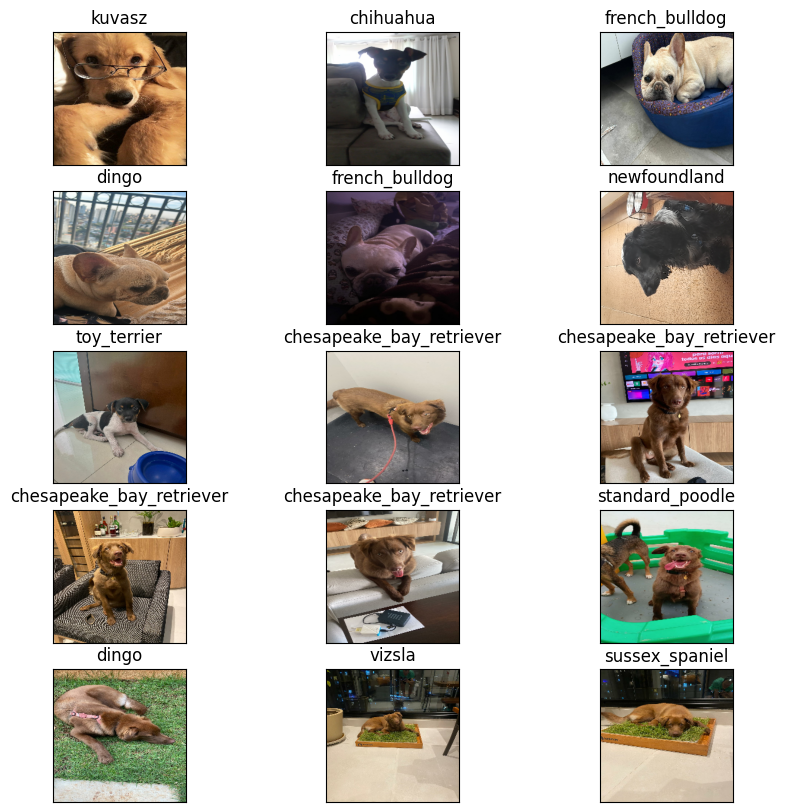

In [ ]:
import math

# Checking custom image predictions:

plt.figure(figsize = (10,10))

for i, image in enumerate(custom_images):

  plt.subplot(math.ceil(len(custom_images)/3), 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])

  plt.imshow(image)